## 3

**Question:**

Please  do  clustering  by  two  different  algorithms  with  one  dataset.  Select  one  dataset  public  which 
consists  of  more  than  10  features.  Please  do  some  tasks  Exploratory  Data  Analysis  (EDA),  feature 
engineering and  some  pre-processing if  you  feel  need  it.  Please  explain  each  your  task results  (LO1, 
LO3, LO4, 17 poin)

**Answer**


In [1]:
import pandas as pd
pd.set_option('future.no_silent_downcasting',True)

dt = pd.read_csv('./data.csv')


In [2]:
# Descripbe Data Shape
print("Data Shape")
print(dt.shape)
print("--------------")

# Describe overall data
print("Data Info")
print(dt.info(memory_usage=False))
print("--------------")

print("Data Description")
print(dt.describe())
print("--------------")


Data Shape
(207, 41)
--------------
Data Info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 207 entries, 0 to 206
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             207 non-null    int64  
 1   ID                     207 non-null    int64  
 2   Country of Origin      207 non-null    object 
 3   Farm Name              205 non-null    object 
 4   Lot Number             206 non-null    object 
 5   Mill                   204 non-null    object 
 6   ICO Number             75 non-null     object 
 7   Company                207 non-null    object 
 8   Altitude               206 non-null    object 
 9   Region                 205 non-null    object 
 10  Producer               206 non-null    object 
 11  Number of Bags         207 non-null    int64  
 12  Bag Weight             207 non-null    object 
 13  In-Country Partner     207 non-null    object 
 14  Harvest Year

In [20]:
from ydata_profiling import ProfileReport

ProfileReport(dt, title="Profiling Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Data preprocessing

| Column                | Type | Miss | Imb | Zero | Desc |
|-----------------------|------|------|-----|------|------|
| Variety               | Cat  | X    | -   | -    |      |
| Processing Method     | Cat  | X    | X   | -    | Add Na as new value    |
| Aroma                 | Real | -    | -   | -    |      |
| Flavor                | Real | -    | -   | -    |      |
| Aftertaste            | Real | -    | -   | -    |      |
| Acidity               | Real | -    | -   | -    |      |
| Body                  | Real | -    | -   | -    |      |
| Balance               | Real | -    | -   | -    |      |
| Moisture Percentage   | Real | -    | -   | -    |      |
| Cat One Defects       | Real | -    | -   | X    |      |
| Cat Two Defects       | Real | -    | -   | X    |      |
| Color                 | Cat  | -    | -   | -    |      |



In [4]:
from sklearn.preprocessing import MinMaxScaler, LabelEncoder

df = dt.copy()
df = df[['Variety', 'Processing Method','Aroma', 'Flavor', 'Aftertaste', 'Acidity', 'Body', 'Balance','Overall', 'Moisture Percentage', 'Category One Defects','Category Two Defects', 'Color']]

# fill missing value
df.fillna(value={"Processing Method": "other"})


# Encode Categorical Value
label_encoder = LabelEncoder()
df['Variety'] = label_encoder.fit_transform(df['Variety'])
df['Processing Method'] = label_encoder.fit_transform(df['Processing Method'])
df['Color'] = label_encoder.fit_transform(df['Color'])

# Normalisation using min_max scaller
mms = MinMaxScaler()
for i in df.columns.to_list():
    df[i] = mms.fit_transform(df[[i]])



In [5]:
df

,Variety,Processing Method,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Overall,Moisture Percentage,Category One Defects,Category Two Defects,Color
0,0.083333,0.1,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.874074,0.0,0.1875,0.363636
1,0.395833,0.8,0.961538,1.000000,0.714286,0.668571,0.767606,0.902857,0.958115,0.777778,0.0,0.0000,0.000000
2,0.416667,0.7,0.879808,0.954286,0.805714,0.765714,0.767606,0.857143,0.869110,0.770370,0.0,0.1250,1.000000
3,0.395833,0.8,0.759615,0.811429,0.857143,0.811429,0.943662,0.805714,0.827225,0.874074,0.0,0.0000,0.363636
4,0.604167,0.3,0.879808,0.902857,0.805714,0.811429,0.767606,0.714286,0.827225,0.859259,0.0,0.1250,0.909091
...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,0.520833,0.4,0.322115,0.240000,0.142857,0.194286,0.415493,0.285714,0.214660,0.844444,0.0,0.2500,0.363636
203,0.645833,0.4,0.399038,0.188571,0.045714,0.194286,0.415493,0.285714,0.214660,0.770370,0.0,0.7500,0.363636
204,0.166667,0.8,0.360577,0.240000,0.234286,0.097143,0.176056,0.234286,0.172775,0.859259,0.0,0.6875,0.363636
205,0.500000,0.4,0.000000,0.000000,0.045714,0.194286,0.176056,0.188571,0.083770,0.814815,0.0,0.8125,0.090909


### Data processing

We use 2 different algorithm, namely :

| Method name | Scalability | Usecase | Geometry (metric used) |
|-------------|-------------|---------|-------------------------|
| K mean      | large sample, medium cluster             | General-purpose, even cluster size, flat geometry, not too many clusters, inductive          | Distances between points                        |
| OPTICS     | Very large samples, large clusters            | Non-flat geometry, uneven cluster sizes, variable cluster density, outlier removal, transductive        | Distances between nearest points                        | 


To measure optimum k / cluster count, we use elbow method with withinin cluster minimum square (WCSS) value.
To measure performance of cluster, we use silhoutte value.



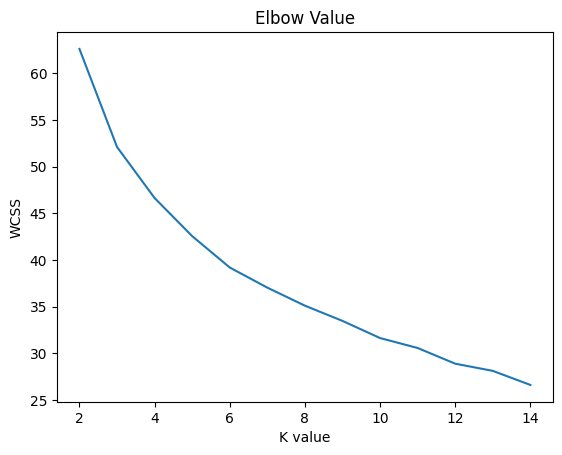

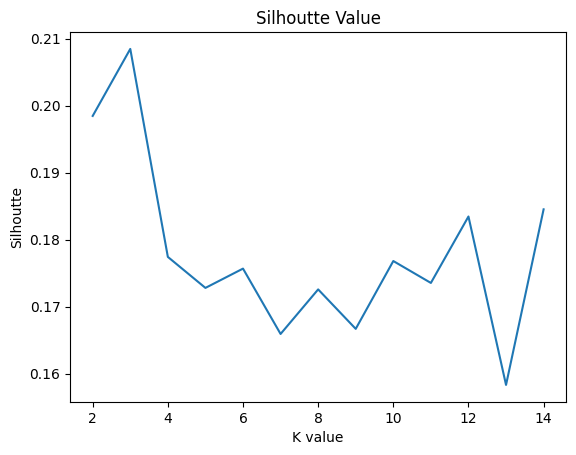

0.20877024996116478


In [19]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

%matplotlib inline

# Finding optimum k value using elbow method
wcss = []  
silhouttes = []
max_k = 15
for i in range(2, max_k):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10)
    kmeans.fit(df)
    if i > 1:
        cluster_pred = kmeans.fit_predict(df)
        s_avg = silhouette_score(df, cluster_pred) # find silhoutte
    silhouttes.append(s_avg)
    wcss.append(kmeans.inertia_) # find wcss

# Plot the Elbow Method
plt.plot(range(2, max_k), wcss)
plt.title('Elbow Value')
plt.xlabel('K value')
plt.ylabel('WCSS')
plt.show()

# plot silhoutte
plt.plot(range(2, max_k), silhouttes)
plt.title('Silhoutte Value')
plt.xlabel('K value')
plt.ylabel('Silhoutte')
plt.show()


final_k = 3
kmeans = KMeans(n_clusters=final_k, init='k-means++', max_iter=300, n_init=10)
cluster_labels = kmeans.fit_predict(df)
s_avg = silhouette_score(df, cluster_labels) # find silhoutte
print(s_avg)



In [7]:
# Visualizing result using PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_result = pca.fit_transform(df)

features = ['Aroma', 'Flavor', 'Aftertaste', 'Acidity', 'Body', 'Balance', 'Overall', 'Moisture Percentage', 'Category One Defects', 'Category Two Defects', 'Color']
df['Cluster'] = cluster_labels


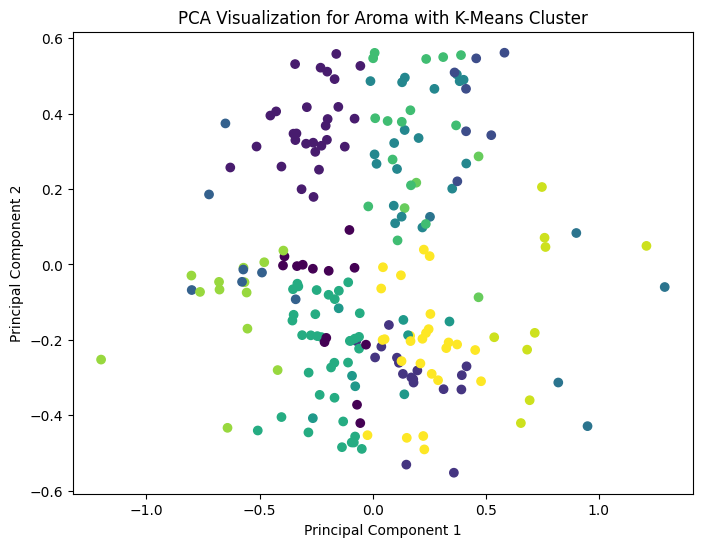

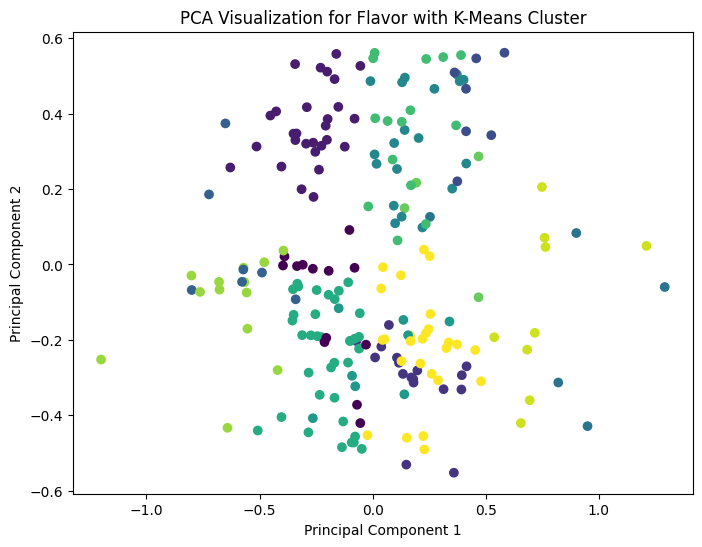

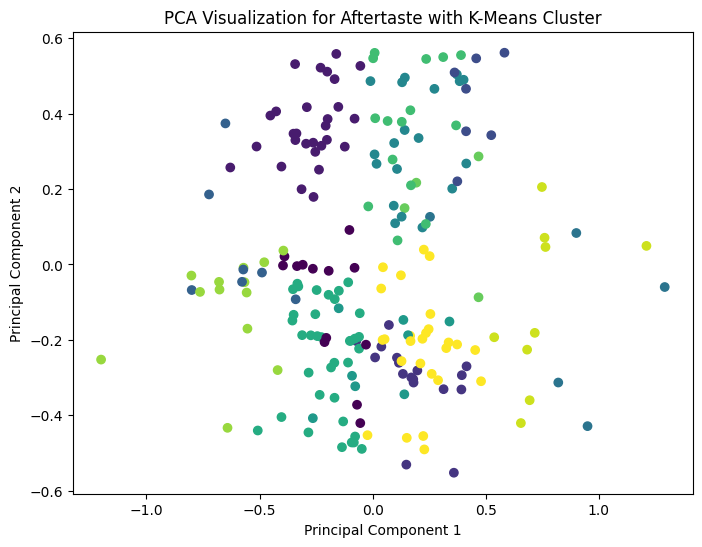

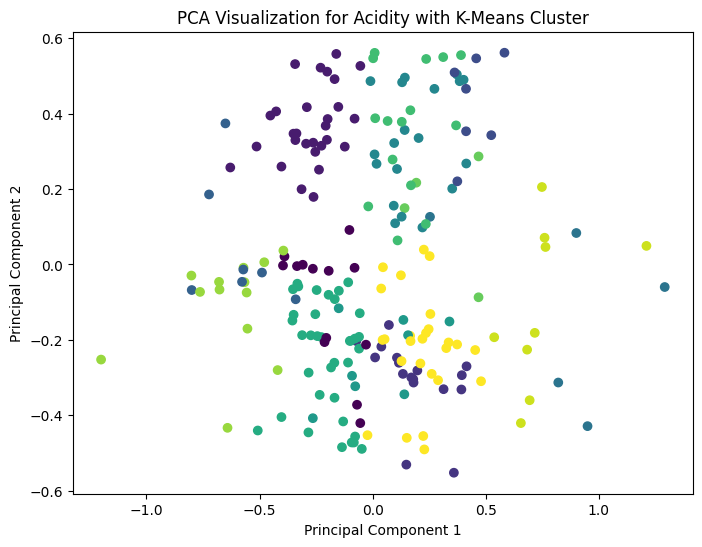

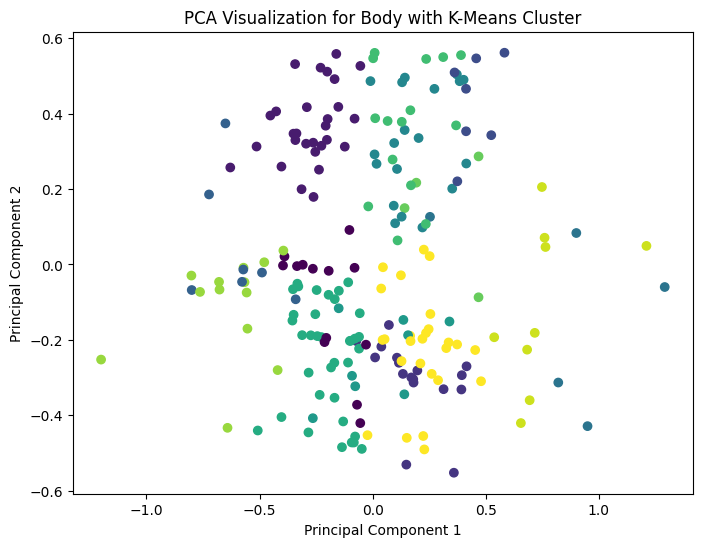

...

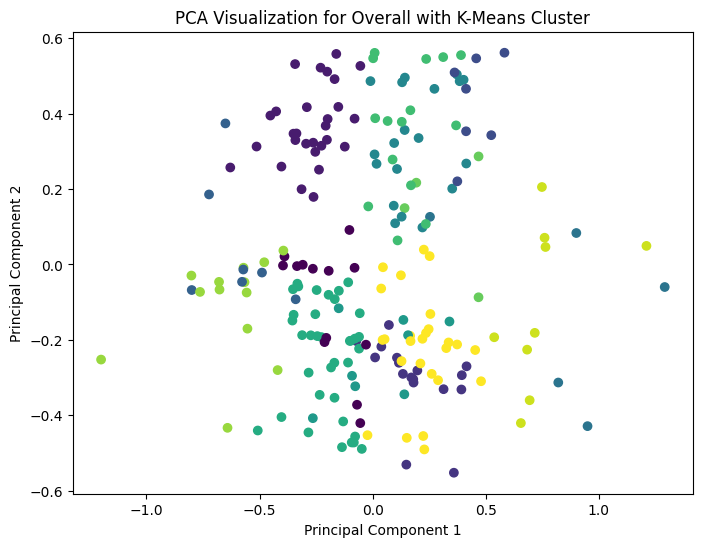

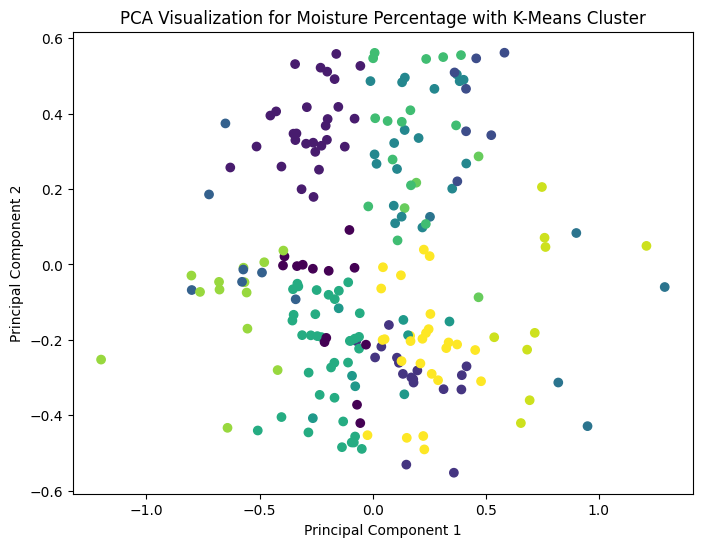

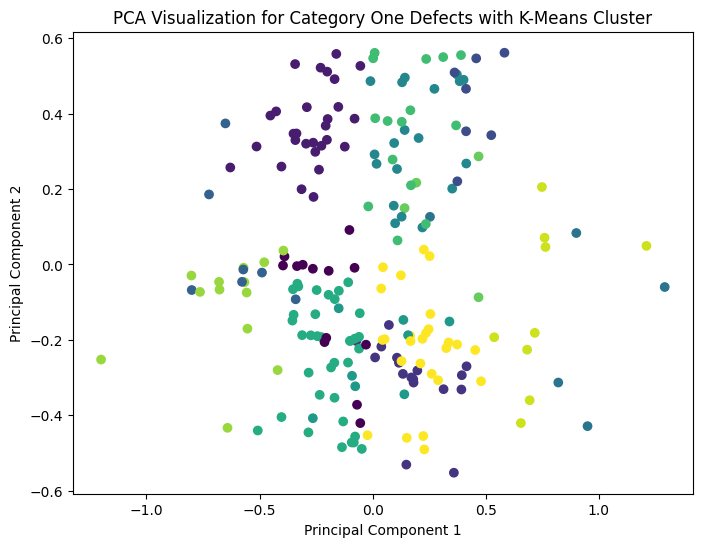

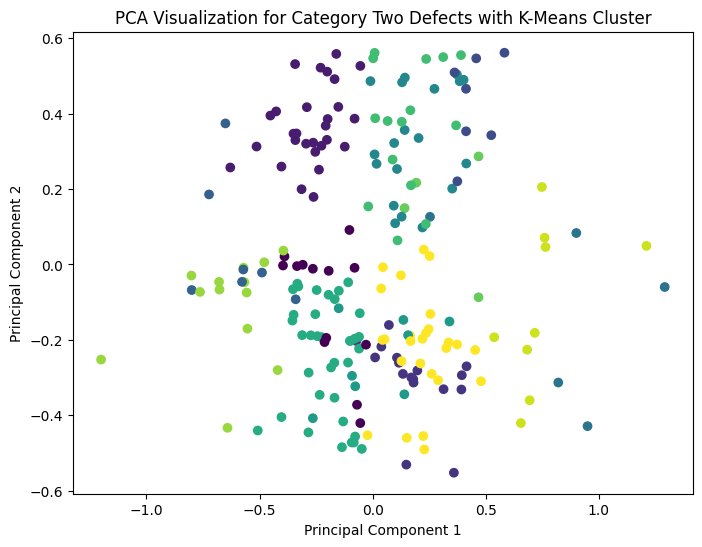

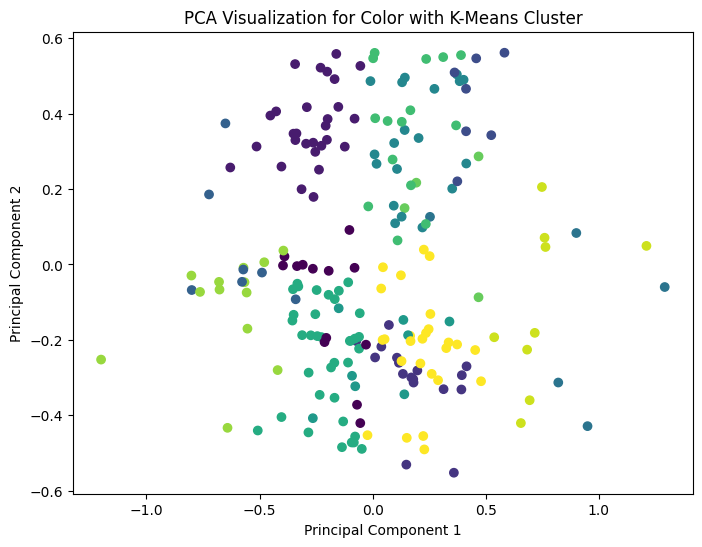

In [10]:
for feature in features:
    plt.figure(figsize=(8, 6))
    
    # Scatter plot
    plt.scatter(pca_result[:, 0], pca_result[:, 1], c=df['Cluster'], cmap='viridis')
    
    # Adding labels
    plt.title(f'PCA Visualization for {feature} with K-Means Cluster')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    
    # Adding legend
    plt.show()

In [16]:
from sklearn.cluster import OPTICS
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

%matplotlib inline

optics = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.05)
cluster_labels = optics.fit_predict(df)

labels = optics.labels_

num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print(num_clusters)

s_avg = silhouette_score(df, cluster_labels) # find silhoutte
print(s_avg)

2
-0.045546776438058115


In [6]:
# Visualizing result using PCA
from sklearn.decomposition import PCA

pca2 = PCA(n_components=2)
pca_result2 = pca2.fit_transform(df)


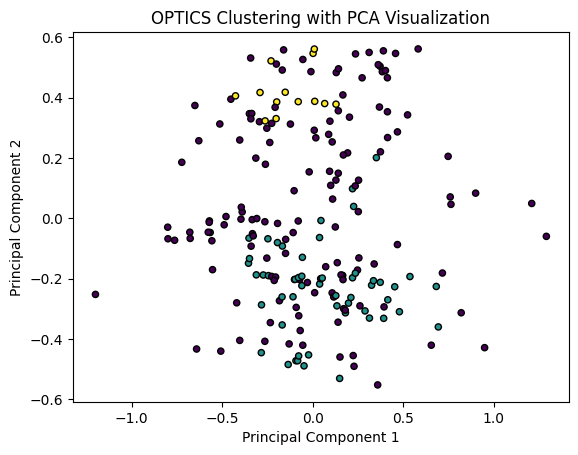

In [15]:
plt.scatter(pca_result2[:, 0], pca_result2[:, 1], c=labels, cmap='viridis', edgecolors='k', s=20)
plt.title('OPTICS Clustering with PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()